In [38]:
import jax  # noqa
import jax.numpy as jnp
import jax.random as jrandom
from jax.scipy.linalg import expm
from jaxtyping import Array, Float

import matplotlib.pyplot as plt
from plot_utils import plot_setting

jax.config.update("jax_platform_name", "cpu")
plot_setting()

In [39]:
class Transformer:
    def __init__(self, d, choice="polytope", fn=lambda _: 1.0, *, key):
        self.d = d
        self.A, self.V = self._init_params(choice, fn, key=key)

    def _init_params(self, choice, fn=lambda _: 1.0, *, key):
        if choice == "polytope":
            A = lambda t, key: jnp.eye(self.d)
            V = lambda t, key: jnp.eye(self.d)
        elif choice == "hyperplanes":
            A = lambda t, key: jnp.eye(self.d)
            V = lambda t, key: jnp.abs(jrandom.normal(key=key, shape=(self.d, self.d)))
        elif choice == "random":
            k_a, k_v = jrandom.split(key)
            A = lambda t, key: jrandom.normal(key=k_a, shape=((self.d, self.d)))
            V = lambda t, key: jnp.abs(jrandom.normal(key=k_v, shape=(self.d, self.d)))

        elif choice == "time_dependent":
            key_A, key_V = jrandom.split(key)
            A_0 = jrandom.normal(key=key_A, shape=(self.d,self.d))
            V_0 = jrandom.normal(key=key_V, shape=(self.d,self.d))

            def A(t, key=None):
                return A_0 * fn(t)

            def V(t, key=None):
                return V_0 * fn(t)

        else:
            raise ValueError(f"Unknow choice = {choice}")

        # here A = (QK^T)^{1/2}
        return A, V

    def simulate(self, x0, T, dt, method="rescale", key=None):
        def scan_fn_vanilla(z_t, t_key):
            t, key = t_key
            key_A, key_V = jrandom.split(key)
            # normalize the input
            z_t = jax.nn.normalize(z_t, axis=-1)

            # compute attenion weight
            A_z = z_t @ self.A(t, key_A)
            attn = A_z @ A_z.T
            attn = jax.nn.softmax(attn, axis=-1)
            attn = attn @ (z_t @ self.V(t, key_V))

            vf = attn
            z_t_next = z_t + dt * vf

            return z_t_next, z_t_next

        def scan_fn_rescale(z_t: Float[Array, "seq_len d"], t):
            """This is a replication of paper
            `The emergence of clusters in self-attention dynamics`"""

            # compute attention matrix
            A_exp_Vt_z = z_t @ self.A(t) @ expm(self.V * t)
            attn = A_exp_Vt_z @ A_exp_Vt_z.T
            attn = jax.nn.softmax(attn, axis=-1)

            vf = attn @ (z_t @ self.V)
            vf = vf - z_t @ self.V

            # Euler scheme
            z_t_next = z_t + dt * vf
            return z_t_next, z_t_next

        num_steps = int(T / dt) + 1
        ts = jnp.linspace(0, T, num_steps)

        if method == "rescale":
            scan_fn = scan_fn_rescale
        elif method == "vanilla":
            scan_fn = scan_fn_vanilla
        else:
            raise ValueError(f"Unknown method = {method}")

        keys = jrandom.split(key, ts.shape)
        _, result = jax.lax.scan(scan_fn, init=x0, xs=(ts, keys))

        return jnp.concatenate([x0[None, ...], result], axis=0)

In [40]:
def visualize_3d(simulated_data: Float[Array, "step seq_len 3"], color, end_point=None):
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection="3d")

    # plot starting point
    ax.scatter(
        simulated_data[0, :, 0],
        simulated_data[0, :, 1],
        simulated_data[0, :, 2],
        c="white",
        alpha=0.5,
        marker="o",
        s=100,
        linewidth=1.7,
        edgecolors="blue",
        zorder=3,
        label="start",
    )

    # plot end point
    if end_point is None:
        end_point = simulated_data.shape[0]
    ax.scatter(
        simulated_data[-1, :, 0],
        simulated_data[-1, :, 1],
        simulated_data[-1, :, 2],
        c=color,
        alpha=1.0,
        marker="o",
        s=100,
        linewidth=1.75,
        edgecolors="black",
        label="end",
    )

    # plot connection between from start to end
    for i in range(simulated_data.shape[1]):
        ax.plot(
            simulated_data[:, i, 0],
            simulated_data[:, i, 1],
            simulated_data[:, i, 2],
            alpha=0.5,
            color=color,
            linestyle="dashed",
            linewidth=2.25,
            label="trajectory" if i == 0 else None,
        )

    ax.legend()

In [41]:
key = jrandom.PRNGKey(0)
model_key, x0_key = jrandom.split(key)

## Fourth order

/tmp/ipykernel_572582/2900812387.py:40: DeprecationWarning: jax.nn.normalize is deprecated. Use jax.nn.standardize instead.
  z_t = jax.nn.normalize(z_t, axis=-1)


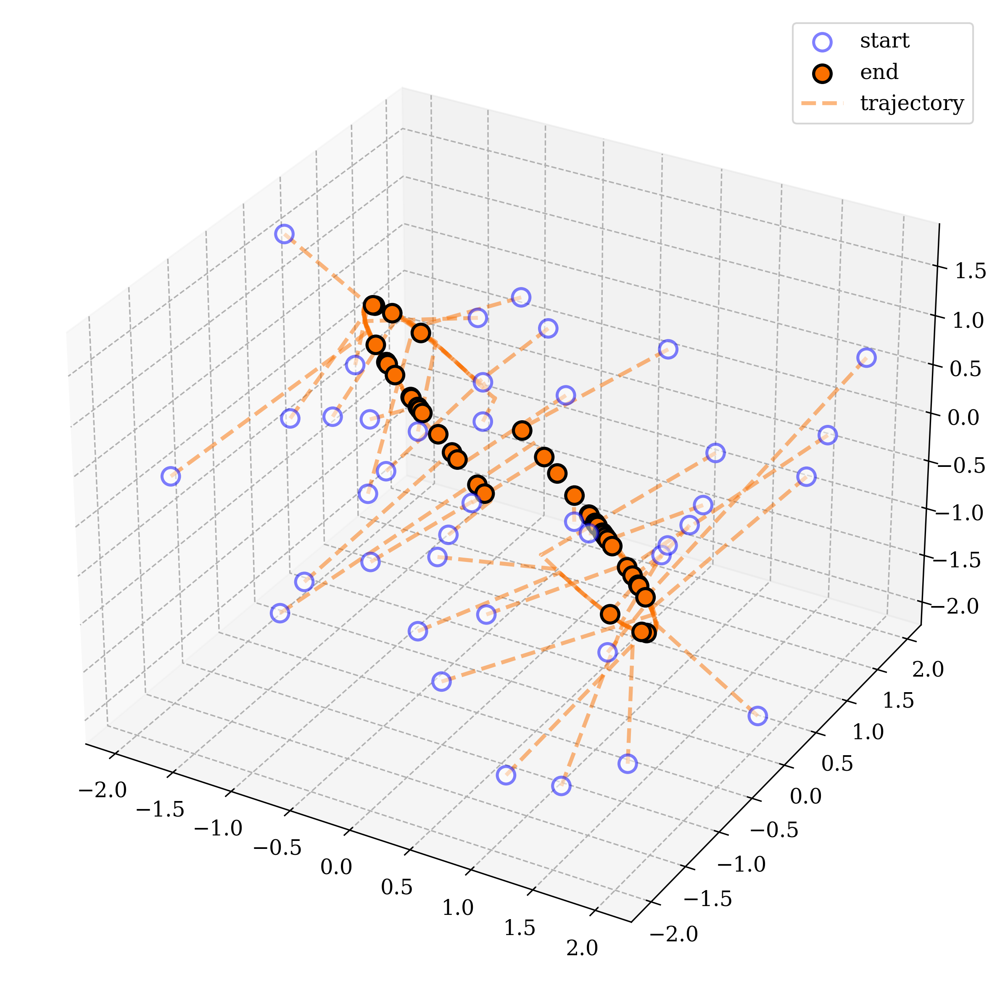

In [5]:
choice = "time_dependent"

d = 3
seq_len = 40
T = 20
dt = 0.1

fn = lambda t: 0.5 * jnp.power(t / T + 1e-6, 4)

transformer = Transformer(d=d, choice=choice, fn=fn, key=model_key)
x0 = jrandom.uniform(key=x0_key, shape=(seq_len, d), minval=-2, maxval=2)
result = transformer.simulate(x0, T=20, dt=0.1, method="vanilla", key=jrandom.key(0))
visualize_3d(result, color="#FA7000")

plt.savefig("../output/figures/simulation/no_cluster.pdf", bbox_inches="tight")
plt.savefig("../output/figures/simulation/no_cluster.jpg", bbox_inches="tight")

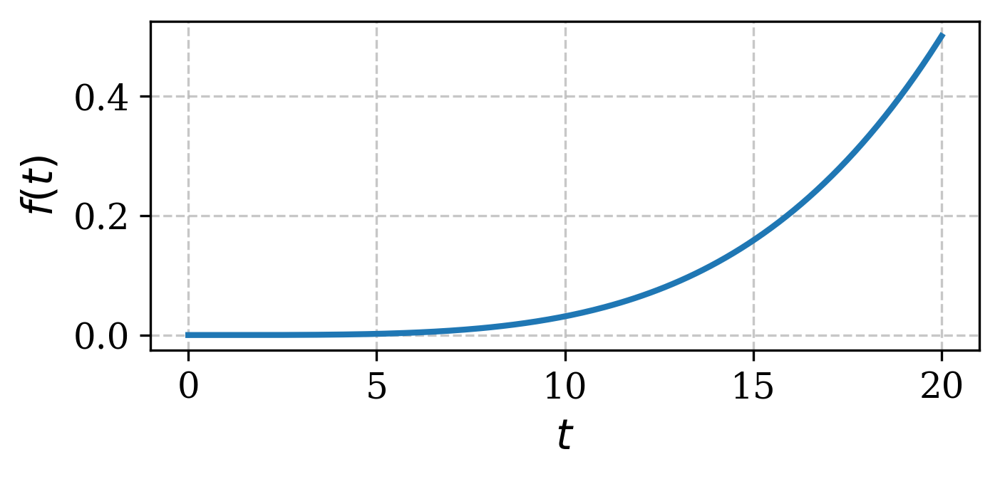

In [6]:
ts = jnp.linspace(0, T, int(T / dt))
plt.figure(figsize=(5, 2))
plt.plot(ts, fn(ts))
plt.xlabel(r"$t$")
plt.ylabel(r"$f(t)$")

plt.savefig("../output/figures/simulation/ft.pdf", bbox_inches="tight")
plt.savefig("../output/figures/simulation/ft.jpg", bbox_inches="tight")

## First-order (linear)

/tmp/ipykernel_572582/2900812387.py:40: DeprecationWarning: jax.nn.normalize is deprecated. Use jax.nn.standardize instead.
  z_t = jax.nn.normalize(z_t, axis=-1)


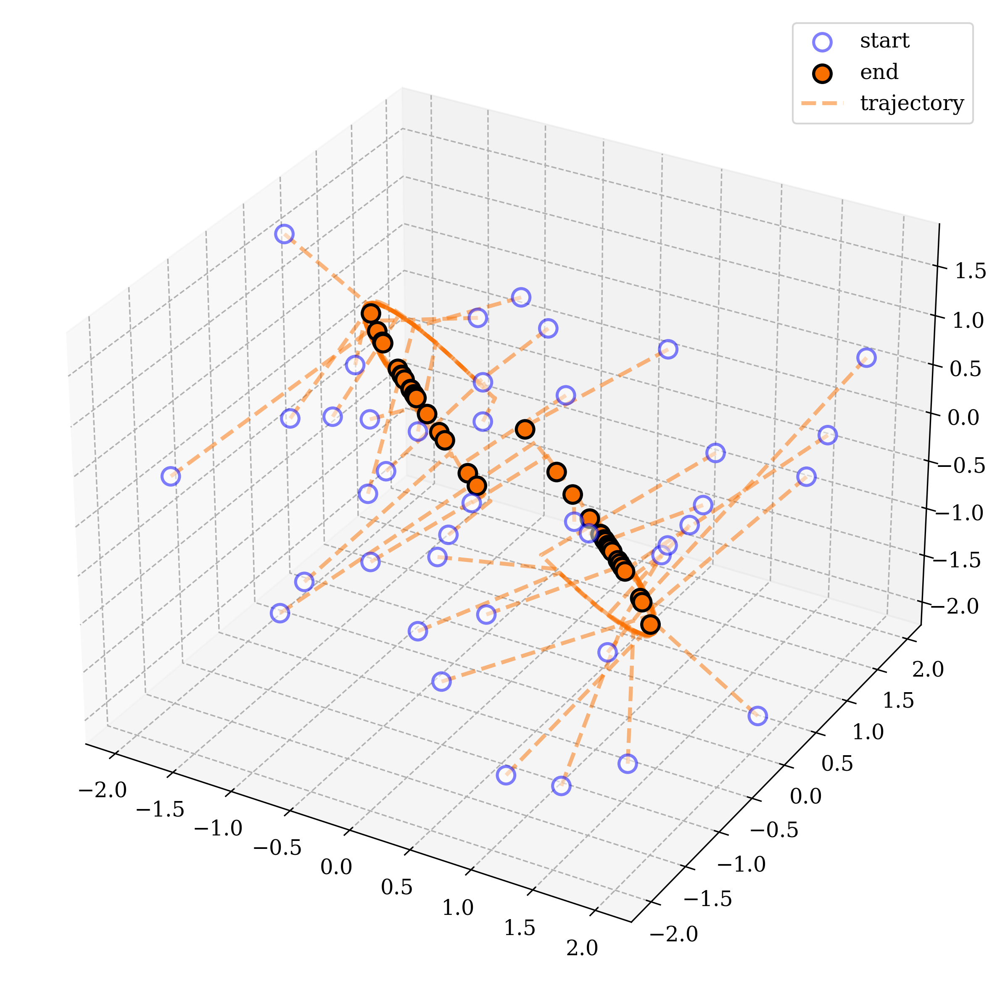

In [7]:
choice = "time_dependent"

d = 3
seq_len = 40
T = 20
dt = 0.1

fn = lambda t: 0.5 * jnp.power(t / T + 1e-6, 1)

transformer = Transformer(d=d, choice=choice, fn=fn, key=model_key)
x0 = jrandom.uniform(key=x0_key, shape=(seq_len, d), minval=-2, maxval=2)
result = transformer.simulate(x0, T=20, dt=0.1, method="vanilla", key=jrandom.key(0))
visualize_3d(result, color="#FA7000")

plt.savefig("../output/figures/simulation/no_cluster_linear.pdf", bbox_inches="tight")
plt.savefig("../output/figures/simulation/no_cluster_linear.jpg", bbox_inches="tight")

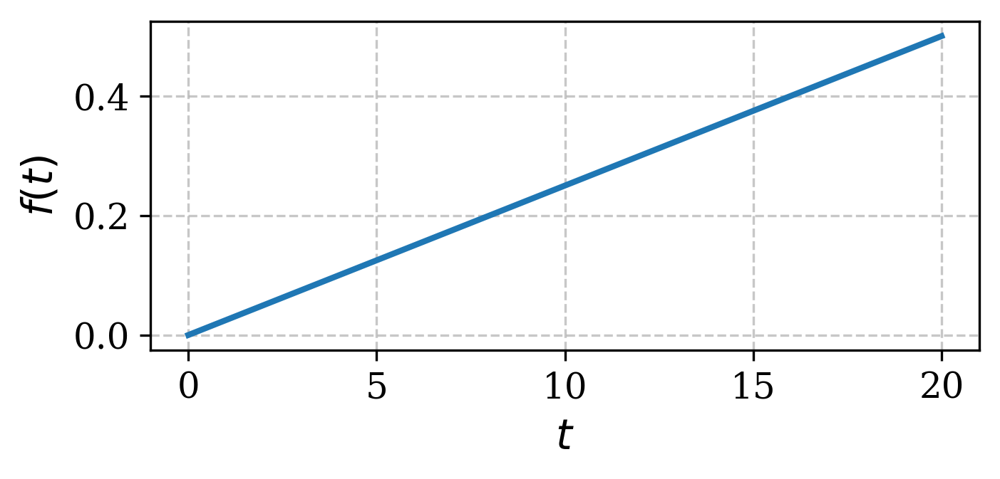

In [8]:
ts = jnp.linspace(0, T, int(T / dt))
plt.figure(figsize=(5, 2))
plt.plot(ts, fn(ts))
plt.xlabel(r"$t$")
plt.ylabel(r"$f(t)$")

plt.savefig("../output/figures/simulation/ft_first_order.pdf", bbox_inches="tight")
plt.savefig("../output/figures/simulation/ft_first_order.jpg", bbox_inches="tight")

## Second-order

/tmp/ipykernel_572582/2900812387.py:40: DeprecationWarning: jax.nn.normalize is deprecated. Use jax.nn.standardize instead.
  z_t = jax.nn.normalize(z_t, axis=-1)


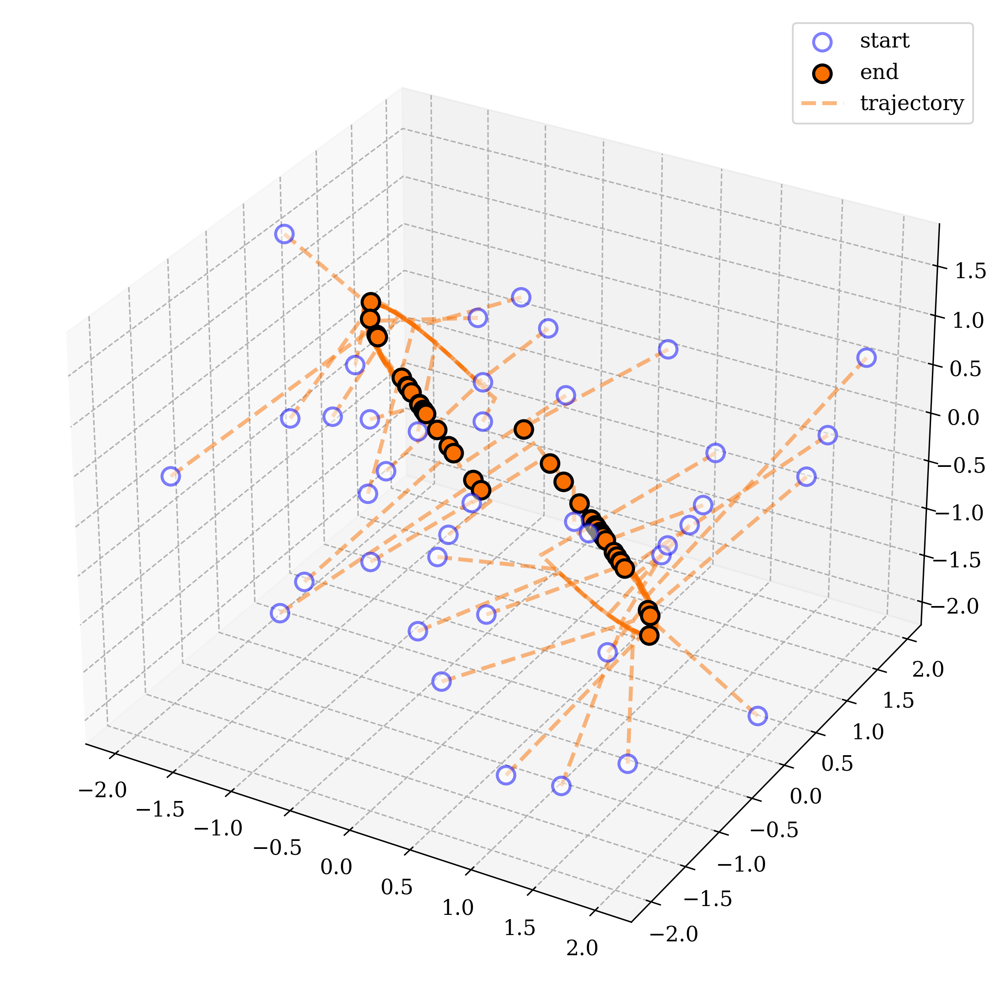

In [9]:
choice = "time_dependent"

d = 3
seq_len = 40
T = 20
dt = 0.1

fn = lambda t: 0.5 * jnp.power(t / T + 1e-6, 2)

transformer = Transformer(d=d, choice=choice, fn=fn, key=model_key)
x0 = jrandom.uniform(key=x0_key, shape=(seq_len, d), minval=-2, maxval=2)
result = transformer.simulate(x0, T=20, dt=0.1, method="vanilla", key=jrandom.key(0))
visualize_3d(result, color="#FA7000")


plt.savefig(
    "../output/figures/simulation/no_cluster_second_order.pdf", bbox_inches="tight"
)
plt.savefig(
    "../output/figures/simulation/no_cluster_second_order.jpg", bbox_inches="tight"
)

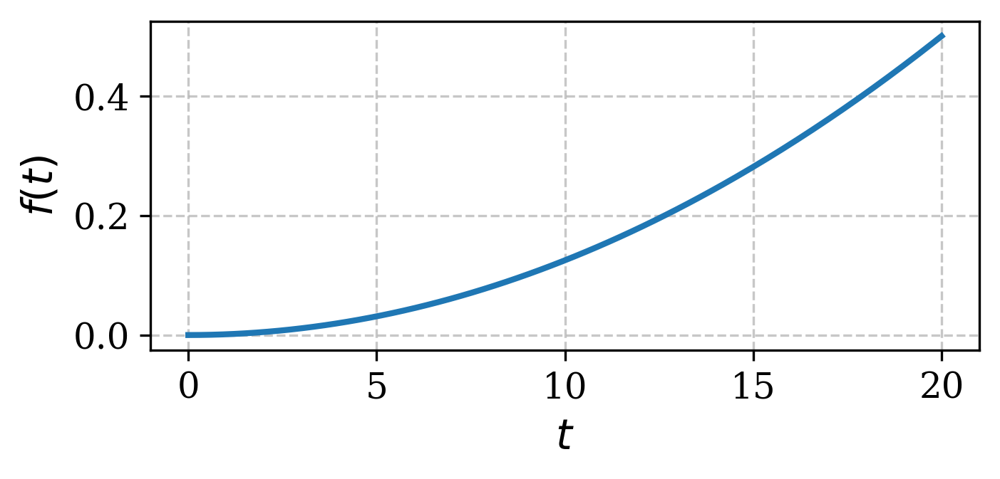

In [10]:
ts = jnp.linspace(0, T, int(T / dt))
plt.figure(figsize=(5, 2))
plt.plot(ts, fn(ts))
plt.xlabel(r"$t$")
plt.ylabel(r"$f(t)$")

plt.savefig("../output/figures/simulation/ft_second_order.pdf", bbox_inches="tight")
plt.savefig("../output/figures/simulation/ft_second_order.jpg", bbox_inches="tight")

## Third order

/tmp/ipykernel_572582/2900812387.py:40: DeprecationWarning: jax.nn.normalize is deprecated. Use jax.nn.standardize instead.
  z_t = jax.nn.normalize(z_t, axis=-1)


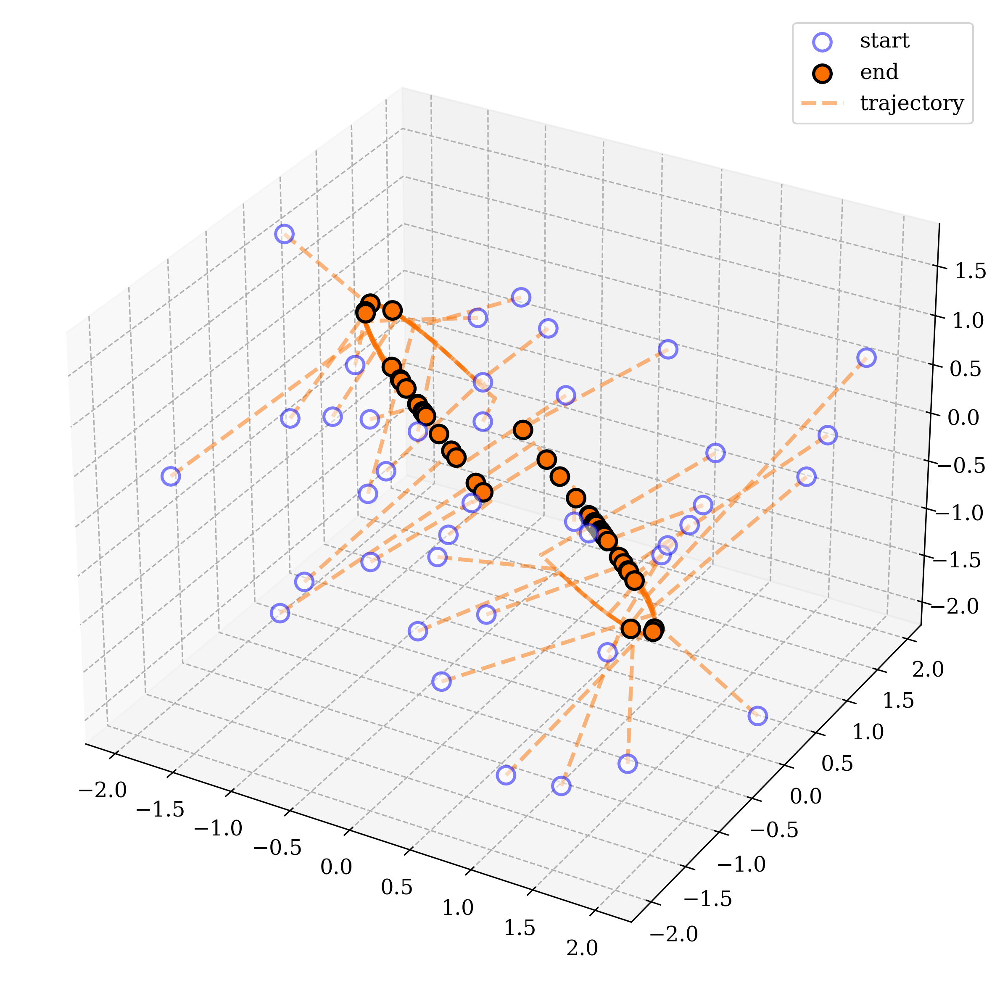

In [11]:
choice = "time_dependent"

d = 3
seq_len = 40
T = 20
dt = 0.1

fn = lambda t: 0.5 * jnp.power(t / T + 1e-6, 3)

transformer = Transformer(d=d, choice=choice, fn=fn, key=model_key)
x0 = jrandom.uniform(key=x0_key, shape=(seq_len, d), minval=-2, maxval=2)
result = transformer.simulate(x0, T=20, dt=0.1, method="vanilla", key=jrandom.key(0))
visualize_3d(result, color="#FA7000")

plt.savefig(
    "../output/figures/simulation/no_cluster_third_order.pdf", bbox_inches="tight"
)
plt.savefig(
    "../output/figures/simulation/no_cluster_third_order.jpg", bbox_inches="tight"
)

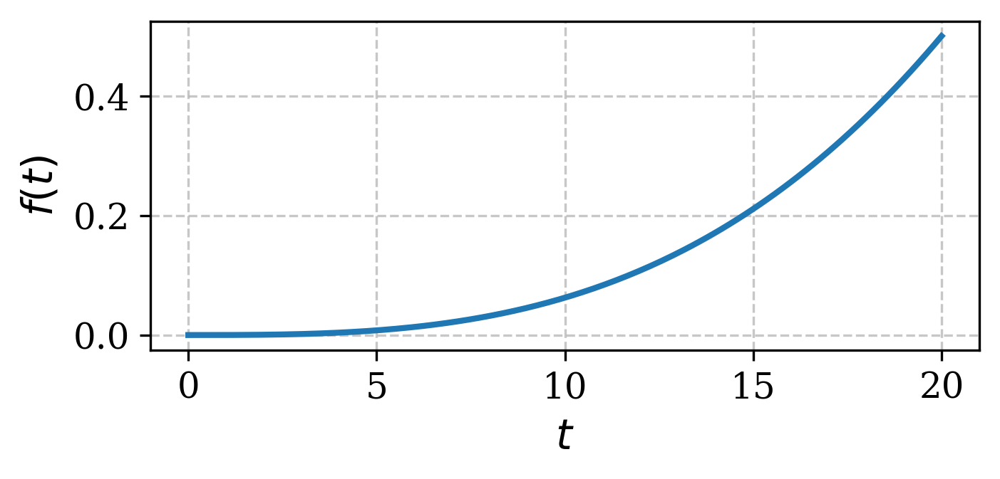

In [12]:
ts = jnp.linspace(0, T, int(T / dt))
plt.figure(figsize=(5, 2))
plt.plot(ts, fn(ts))
plt.xlabel(r"$t$")
plt.ylabel(r"$f(t)$")


plt.savefig("../output/figures/simulation/ft_third_order.pdf", bbox_inches="tight")
plt.savefig("../output/figures/simulation/ft_third_order.jpg", bbox_inches="tight")

/tmp/ipykernel_572582/2900812387.py:40: DeprecationWarning: jax.nn.normalize is deprecated. Use jax.nn.standardize instead.
  z_t = jax.nn.normalize(z_t, axis=-1)


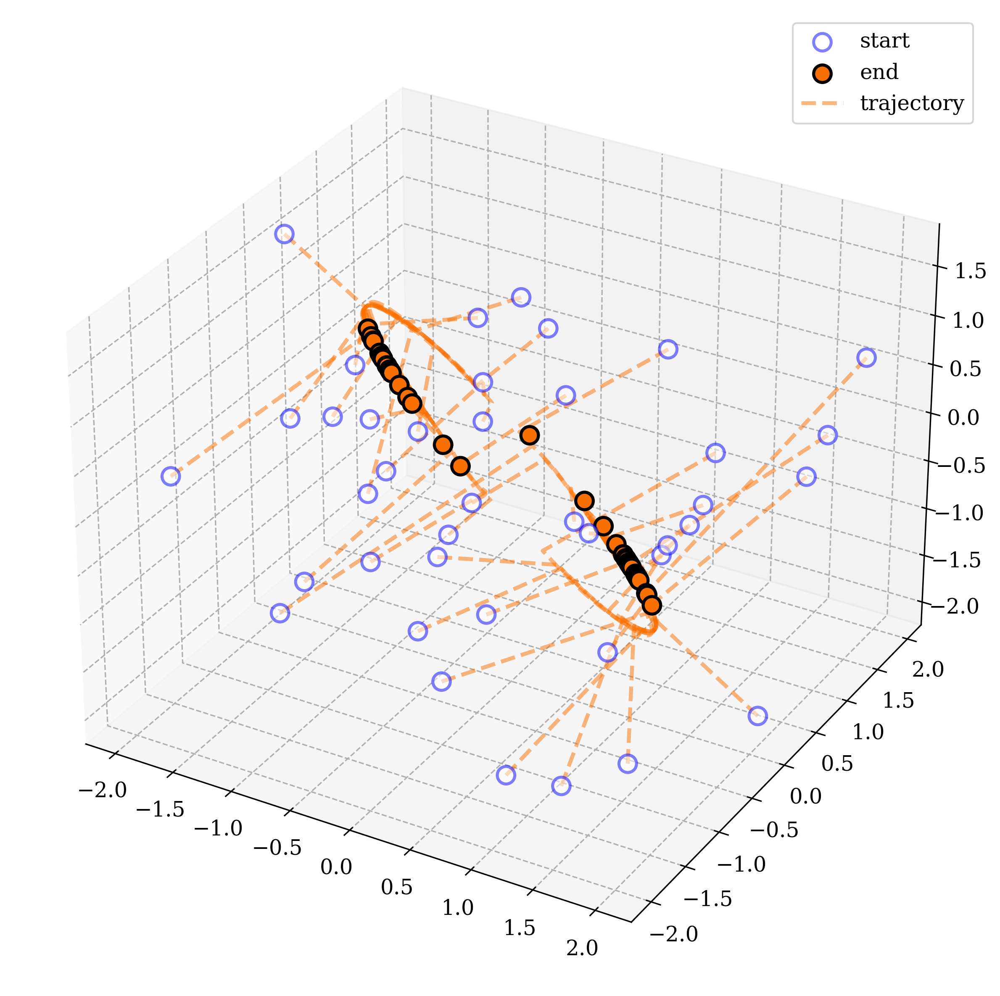

In [13]:
choice = "time_dependent"

d = 3
seq_len = 40
T = 20
dt = 0.1

fn = lambda t: 0.5 - 0.5 * jnp.power(t / T + 1e-6, 4)

transformer = Transformer(d=d, choice=choice, fn=fn, key=model_key)
x0 = jrandom.uniform(key=x0_key, shape=(seq_len, d), minval=-2, maxval=2)
result = transformer.simulate(x0, T=20, dt=0.1, method="vanilla", key=jrandom.key(0))
visualize_3d(result, color="#FA7000")

plt.savefig("../output/figures/simulation/cluster_with_ft.pdf", bbox_inches="tight")
plt.savefig("../output/figures/simulation/cluster_with_ft.jpg", bbox_inches="tight")

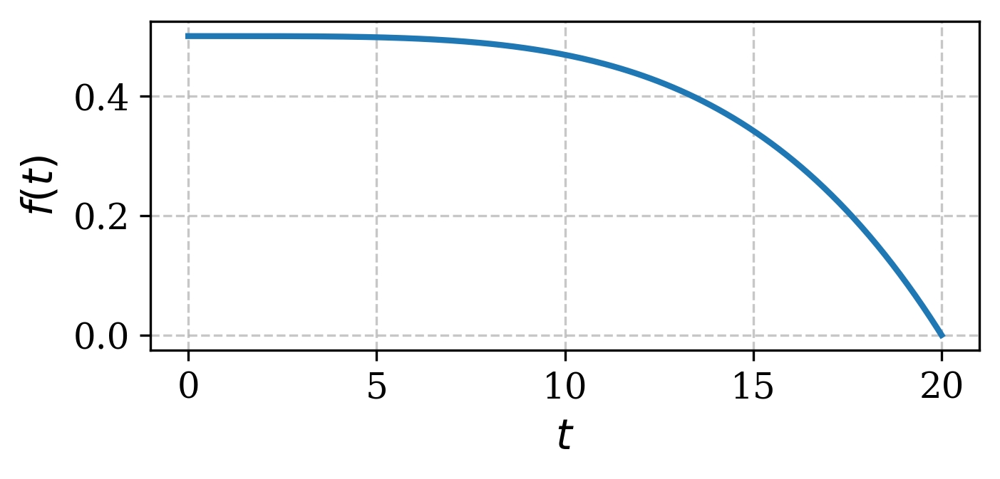

In [14]:
ts = jnp.linspace(0, T, int(T / dt))
plt.figure(figsize=(5, 2))
plt.plot(ts, fn(ts))
plt.xlabel(r"$t$")
plt.ylabel(r"$f(t)$")

plt.savefig("../output/figures/simulation/ft_induce_cluster.pdf", bbox_inches="tight")
plt.savefig("../output/figures/simulation/ft_induce_cluster.jpg", bbox_inches="tight")

/tmp/ipykernel_572582/2900812387.py:40: DeprecationWarning: jax.nn.normalize is deprecated. Use jax.nn.standardize instead.
  z_t = jax.nn.normalize(z_t, axis=-1)


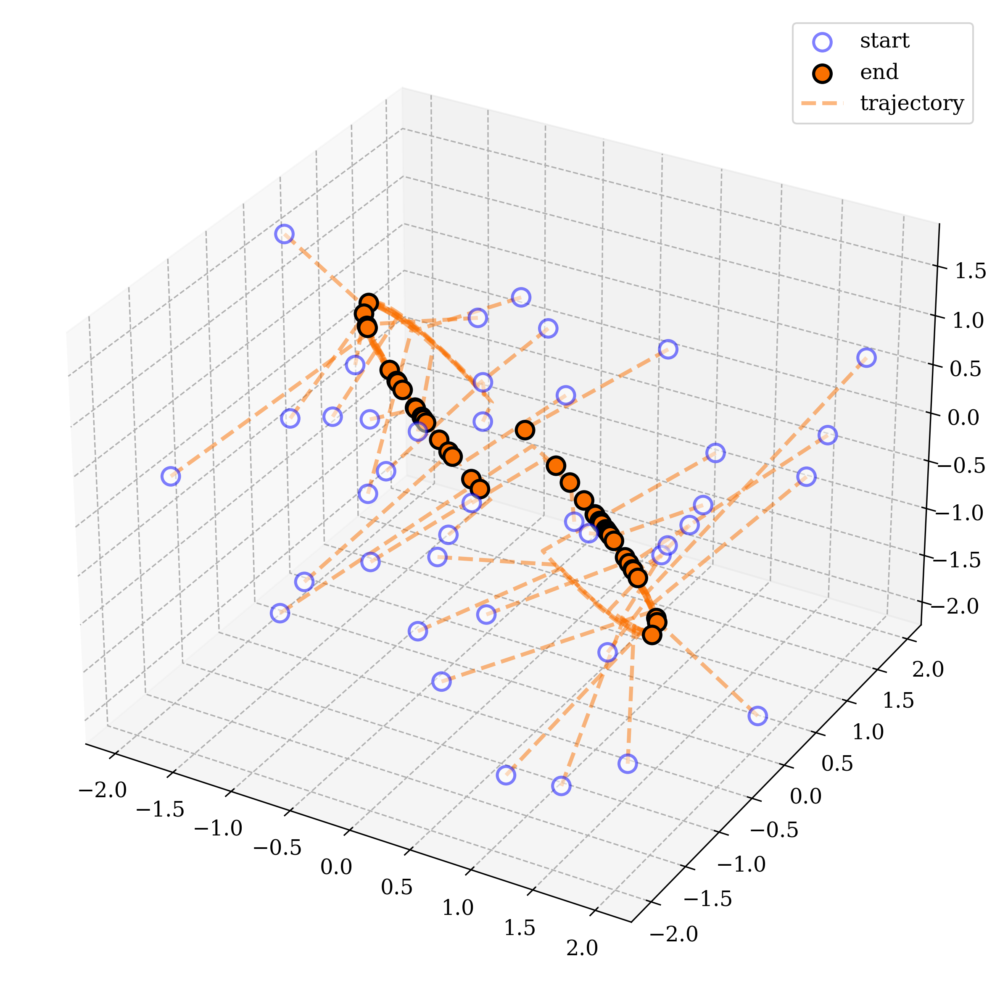

In [15]:
choice = "time_dependent"

d = 3
seq_len = 40
T = 20
dt = 0.1

fn = lambda t: 0.5 * jnp.power(1 - t / T + 1e-6, 2)

transformer = Transformer(d=d, choice=choice, fn=fn, key=model_key)
x0 = jrandom.uniform(key=x0_key, shape=(seq_len, d), minval=-2, maxval=2)
result = transformer.simulate(x0, T=20, dt=0.1, method="vanilla", key=jrandom.key(0))
visualize_3d(result, color="#FA7000")

plt.savefig("../output/figures/simulation/no_cluster_2.pdf", bbox_inches="tight")
plt.savefig("../output/figures/simulation/no_cluster_2.jpg", bbox_inches="tight")

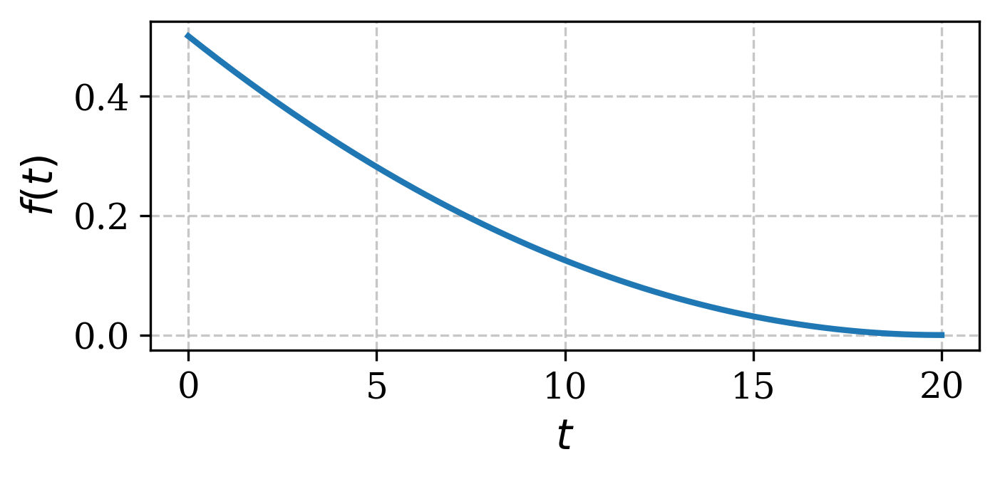

In [16]:
ts = jnp.linspace(0, T, int(T / dt))
plt.figure(figsize=(5, 2))
plt.plot(ts, fn(ts))
plt.xlabel(r"$t$")
plt.ylabel(r"$f(t)$")

plt.savefig("../output/figures/simulation/ft_2.pdf", bbox_inches="tight")
plt.savefig("../output/figures/simulation/ft_2.jpg", bbox_inches="tight")

/tmp/ipykernel_572582/2900812387.py:40: DeprecationWarning: jax.nn.normalize is deprecated. Use jax.nn.standardize instead.
  z_t = jax.nn.normalize(z_t, axis=-1)


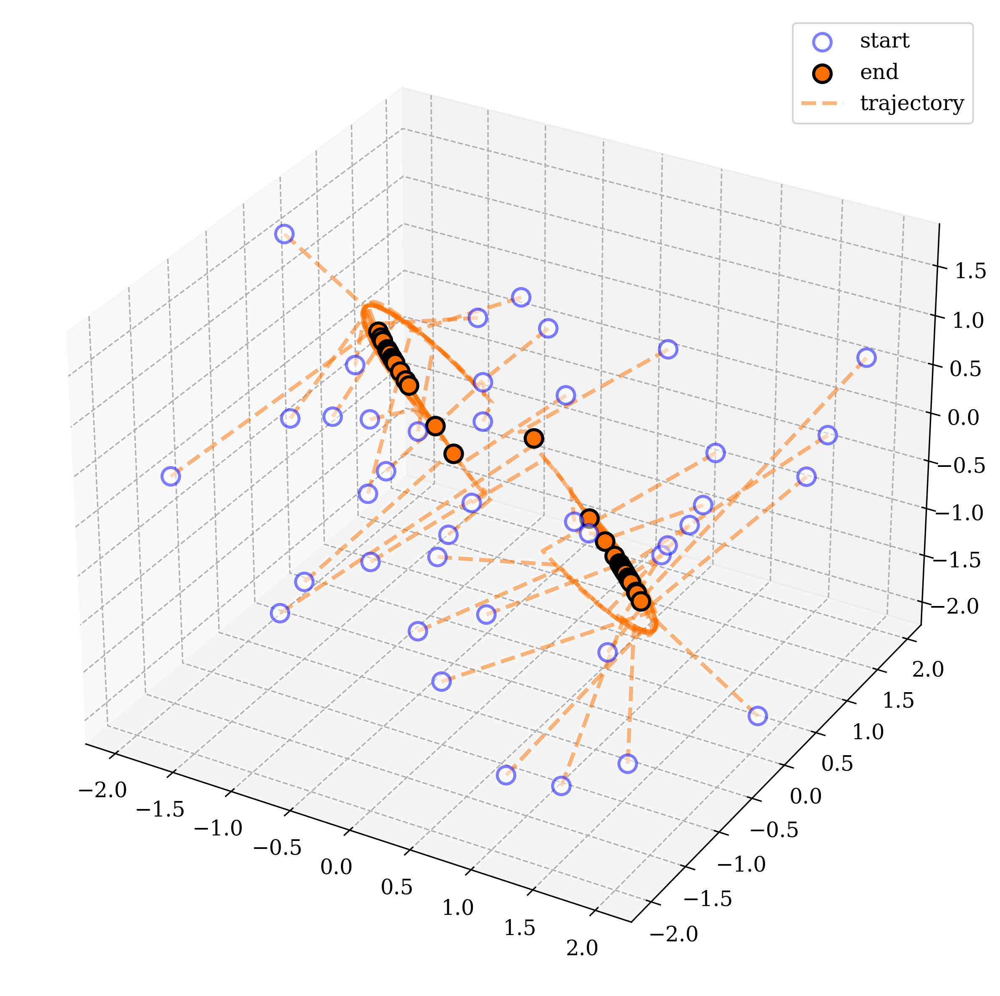

In [65]:
choice = "time_dependent"

d = 3
seq_len = 40
T = 20
dt = 0.1

fn = lambda t:  0.5 * jnp.ones_like(t)

transformer = Transformer(d=d, choice=choice, fn=fn, key=model_key)
x0 = jrandom.uniform(key=x0_key, shape=(seq_len, d), minval=-2, maxval=2)
result = transformer.simulate(x0, T=20, dt=0.1, method="vanilla", key=jrandom.key(0))
visualize_3d(result, color="#FA7000")

plt.savefig("../output/figures/simulation/cluster_constant.pdf", bbox_inches="tight")
plt.savefig("../output/figures/simulation/cluster_constant.jpg", bbox_inches="tight")

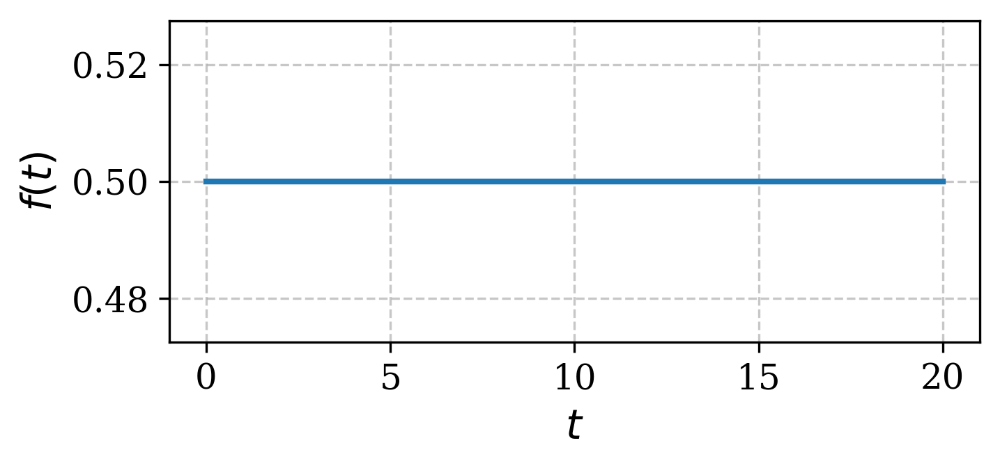

In [66]:
ts = jnp.linspace(0, T, int(T / dt))
plt.figure(figsize=(5, 2))
plt.plot(ts, fn(ts))
plt.xlabel(r"$t$")
plt.ylabel(r"$f(t)$")

plt.savefig("../output/figures/simulation/ft_constant.pdf", bbox_inches="tight")
plt.savefig("../output/figures/simulation/ft_constant.jpg", bbox_inches="tight")

## Random initialization of $Q, K, V$

/tmp/ipykernel_412379/1938944715.py:37: DeprecationWarning: jax.nn.normalize is deprecated. Use jax.nn.standardize instead.
  z_t = jax.nn.normalize(z_t, axis=-1)


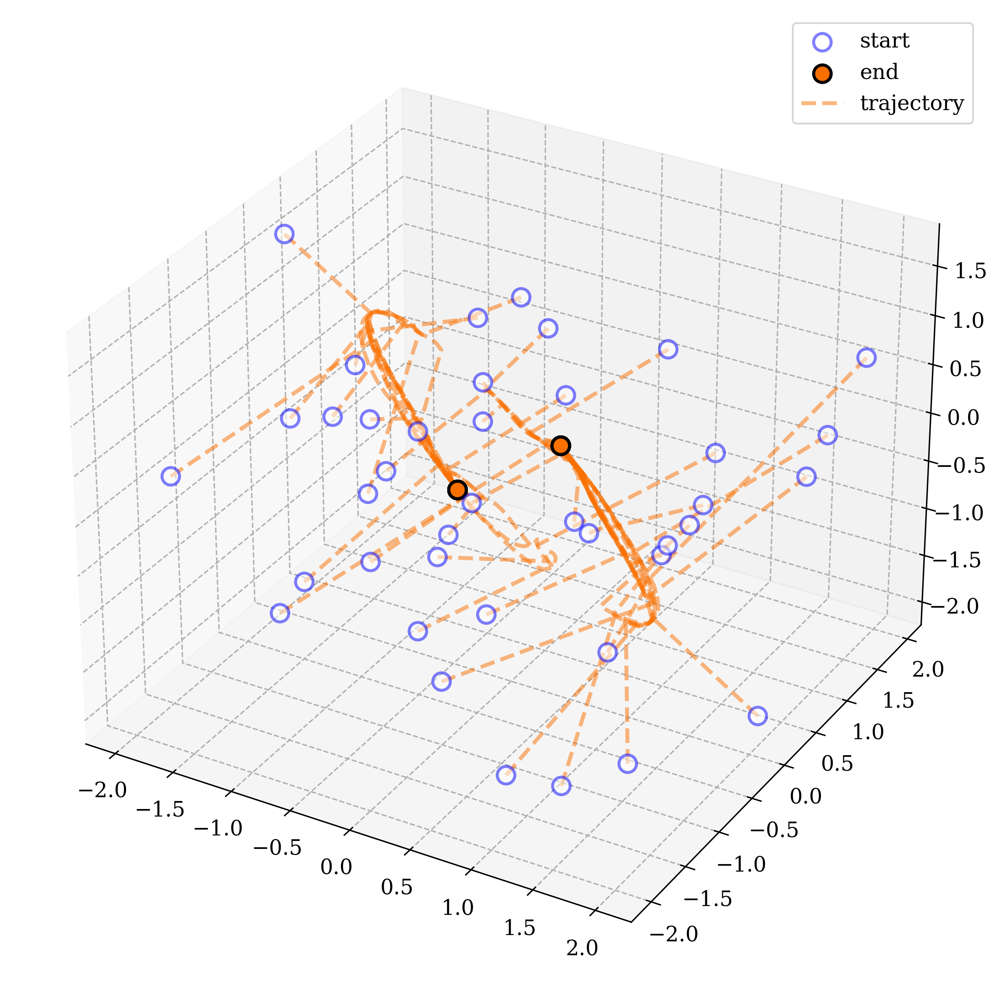

In [161]:
choice = "random"

d = 3
seq_len = 40
transformer = Transformer(d=d, choice=choice, key=model_key)
x0 = jrandom.uniform(key=x0_key, shape=(seq_len, d), minval=-2, maxval=2)
result = transformer.simulate(x0, T=20, dt=0.1, method="vanilla", key=jrandom.key(0))
visualize_3d(result, color="#FA7000")

plt.savefig("../output/figures/simulation/cluster.pdf", bbox_inches="tight")
plt.savefig("../output/figures/simulation/cluster.jpg", bbox_inches="tight")

# $Q, K, V$ are identity matrices

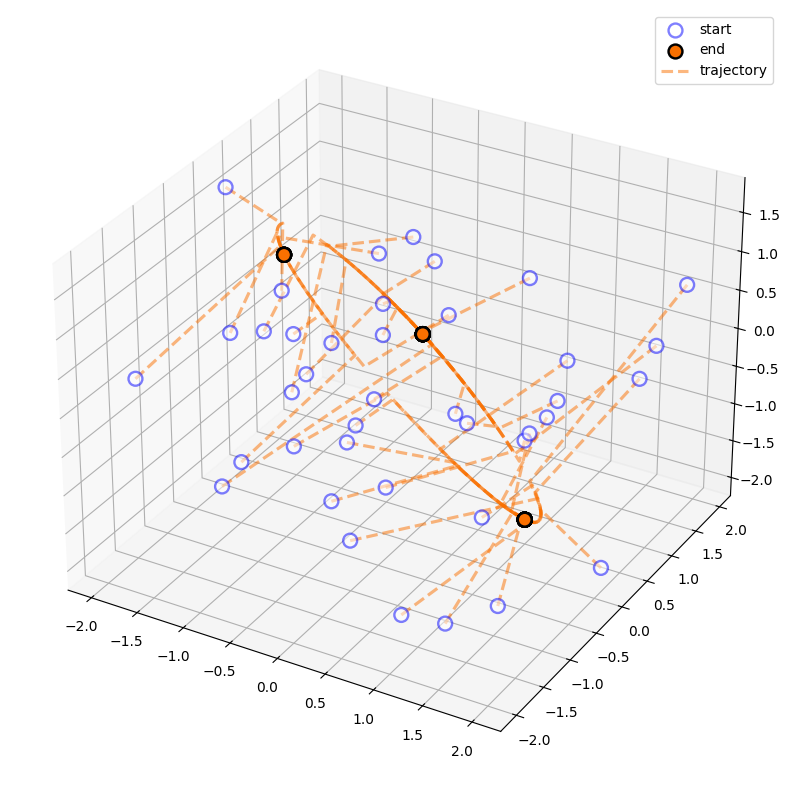

In [6]:
choice = "polytope"

d = 3
seq_len = 40
transformer = Transformer(d=d, choice=choice, key=model_key)
x0 = jrandom.uniform(key=x0_key, shape=(seq_len, d), minval=-2, maxval=2)
result = transformer.simulate(x0, T=20, dt=0.1, method="vanilla")
visualize_3d(result, color="#FA7000")

# $Q,K$ are identity matrices, $V$ is at random initialization

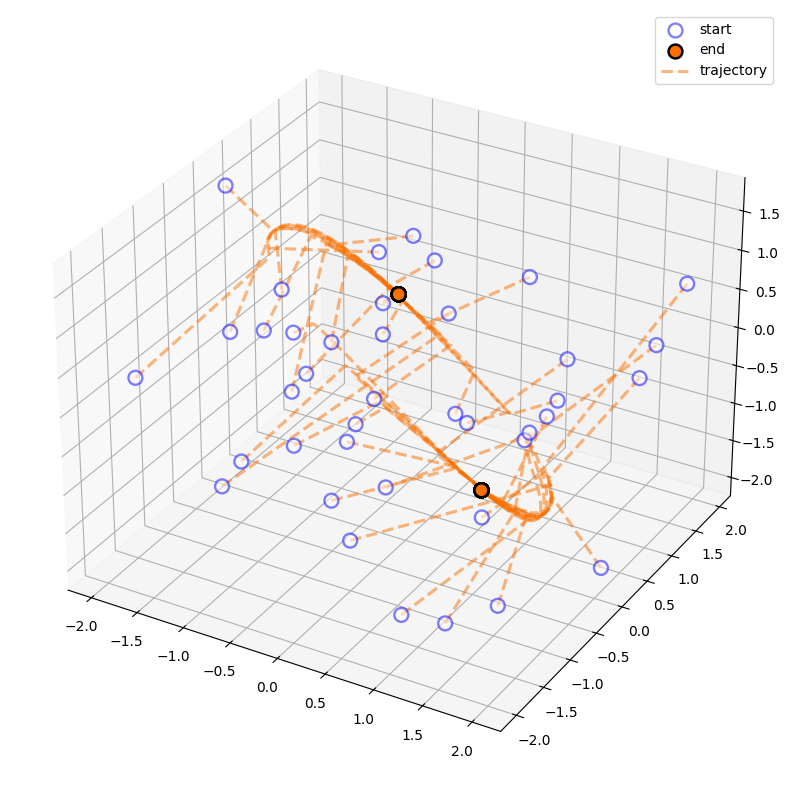

In [7]:
choice = "hyperplanes"

d = 3
seq_len = 40
transformer = Transformer(d=d, choice=choice, key=model_key)
x0 = jrandom.uniform(key=x0_key, shape=(seq_len, d), minval=-2, maxval=2)
result = transformer.simulate(x0, T=20, dt=0.1, method="vanilla")
visualize_3d(result, color="#FA7000")

# Higher dimension

## D = 4

In [8]:
choice = "random"

d = 4
seq_len = 40
transformer = Transformer(d=d, choice=choice, key=model_key)
x0 = jrandom.uniform(key=x0_key, shape=(seq_len, d), minval=-2, maxval=2)
result = transformer.simulate(x0, T=20, dt=0.1, method="vanilla")

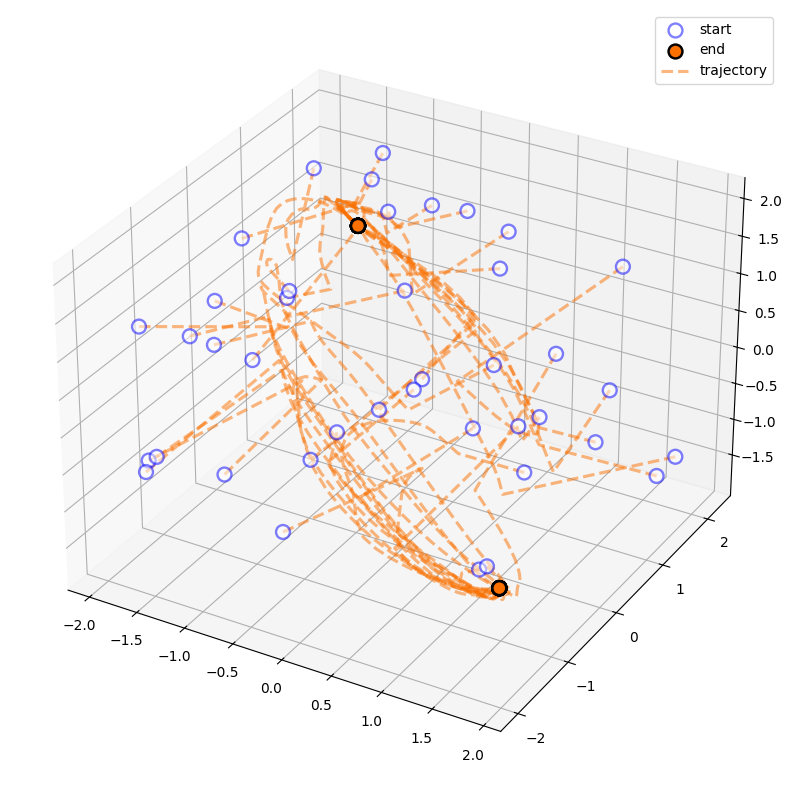

In [9]:
# dimension 0, 1, 2
visualize_3d(result[..., :3], color="#FA7000")

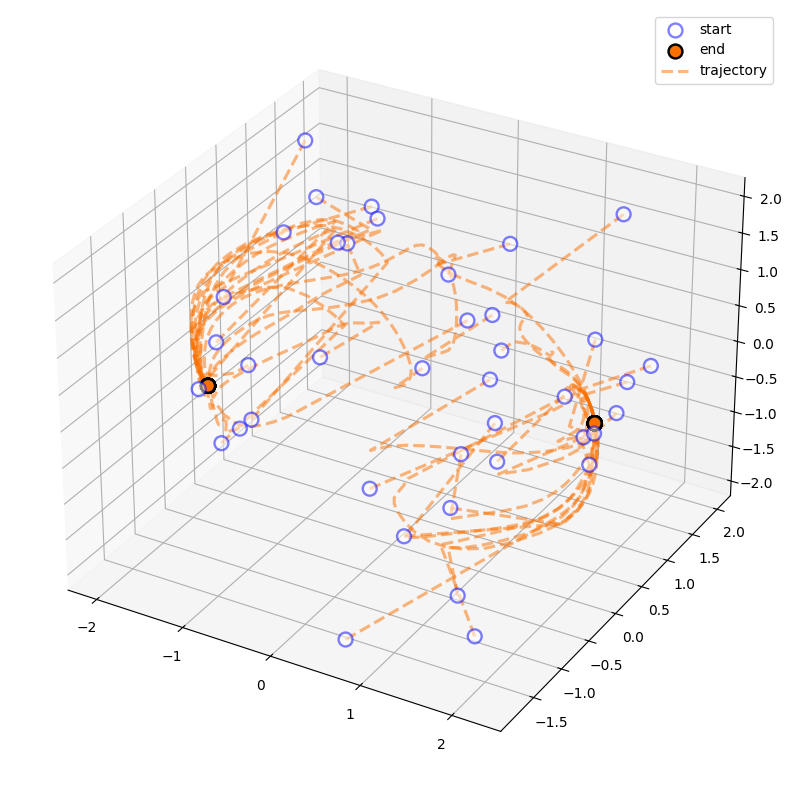

In [10]:
# dimension 1, 2, 3
visualize_3d(result[..., 1:4], color="#FA7000")

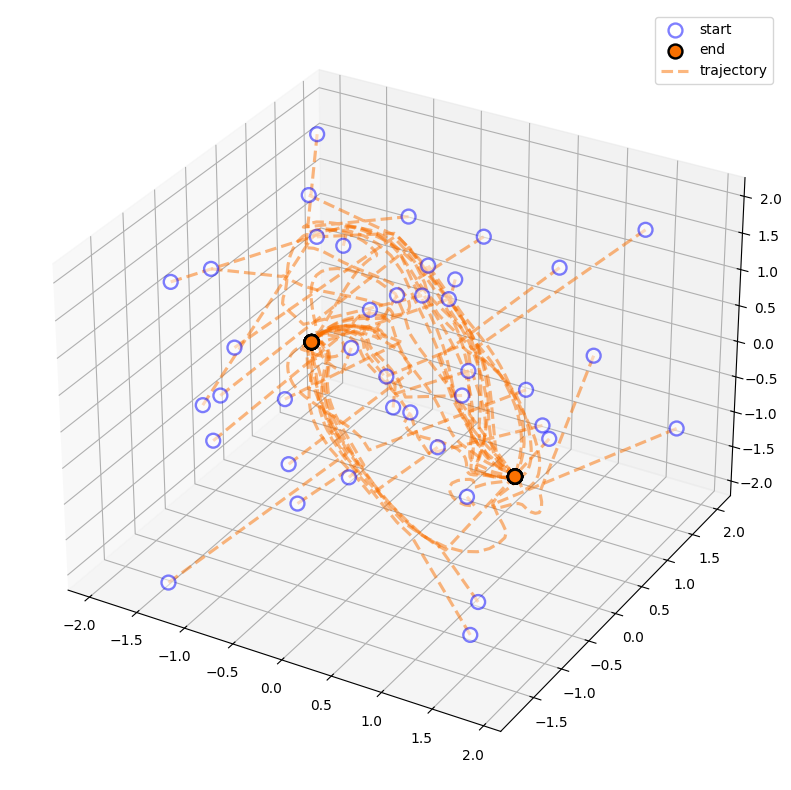

In [11]:
# dimension 0, 2, 3
visualize_3d(result[..., [0, 2, 3]], color="#FA7000")

## D = 8

In [12]:
choice = "random"

d = 8
seq_len = 40
transformer = Transformer(d=d, choice=choice, key=model_key)
x0 = jrandom.uniform(key=x0_key, shape=(seq_len, d), minval=-2, maxval=2)
result = transformer.simulate(x0, T=20, dt=0.1, method="vanilla")

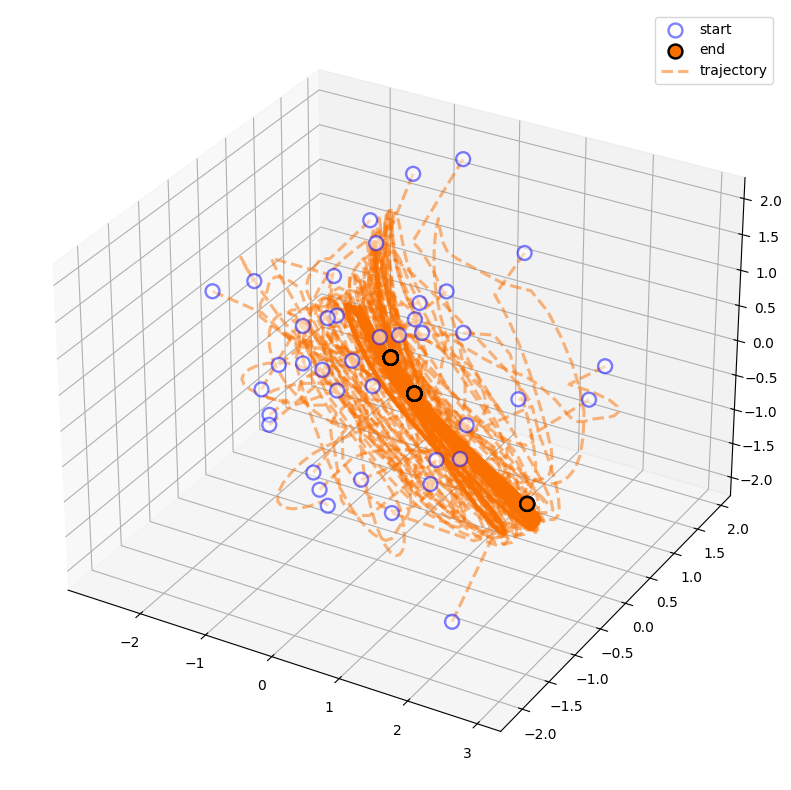

In [13]:
# dimension 0, 1, 2
visualize_3d(result[..., :3], color="#FA7000")

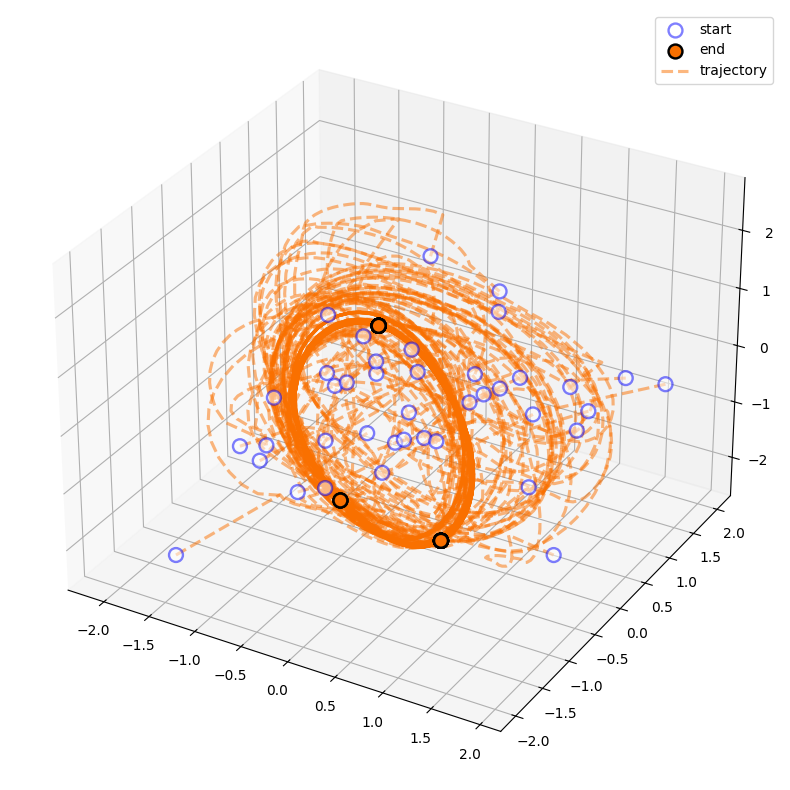

In [14]:
# dimension 1, 2, 3
visualize_3d(result[..., 1:4], color="#FA7000")

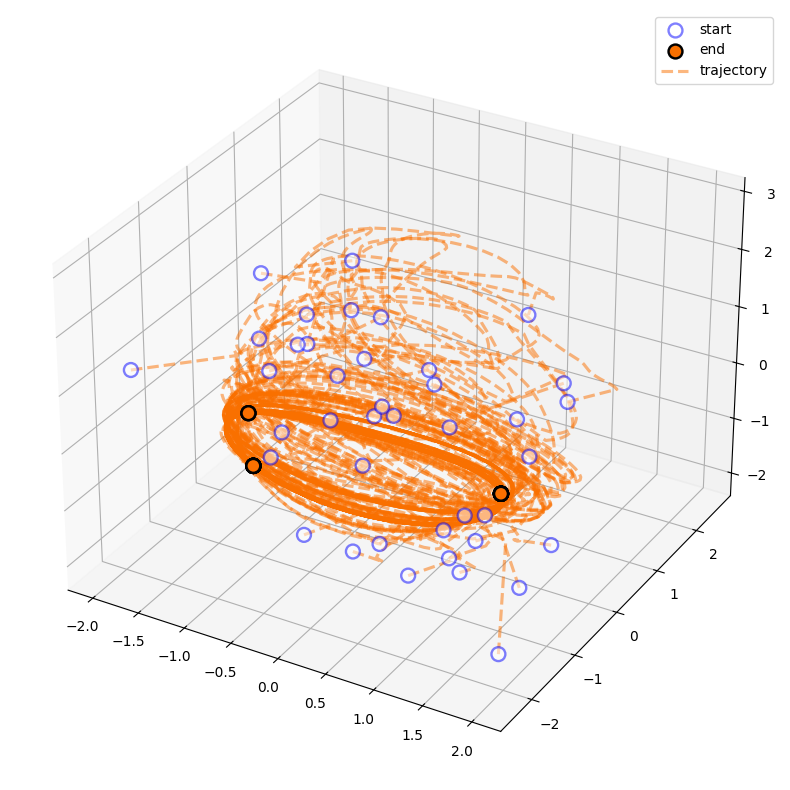

In [15]:
# dimension 2, 3, 4
visualize_3d(result[..., 2:5], color="#FA7000")

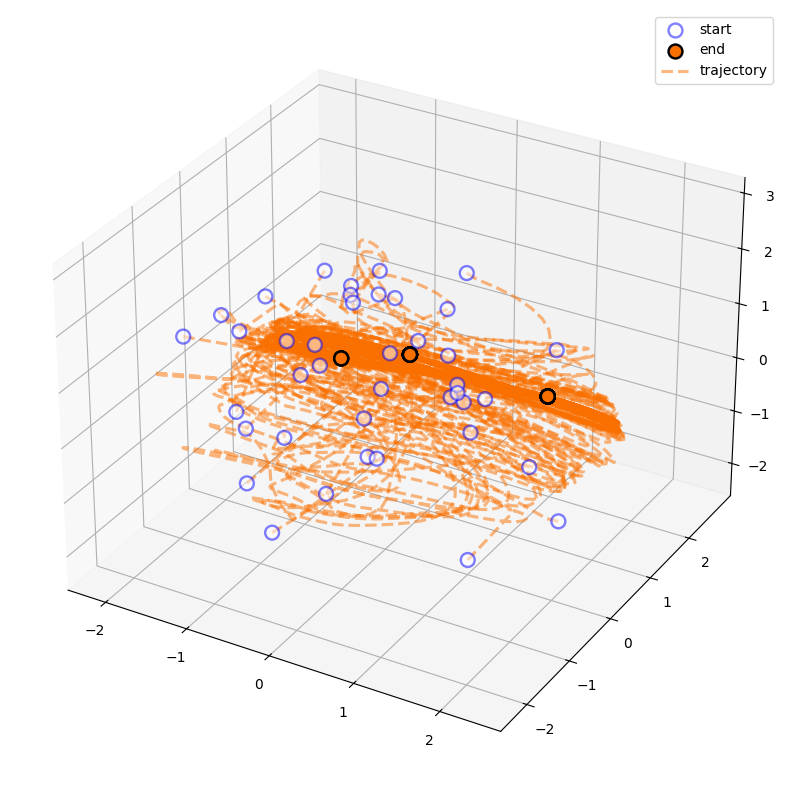

In [16]:
# dimension 5, 6, 7
visualize_3d(result[..., 5:], color="#FA7000")

# Rescale instead of normalization
See paper [The emergence of clusters in self-attention dynamics](https://arxiv.org/abs/2305.05465)

## $Q, K, V$ are identity matrices

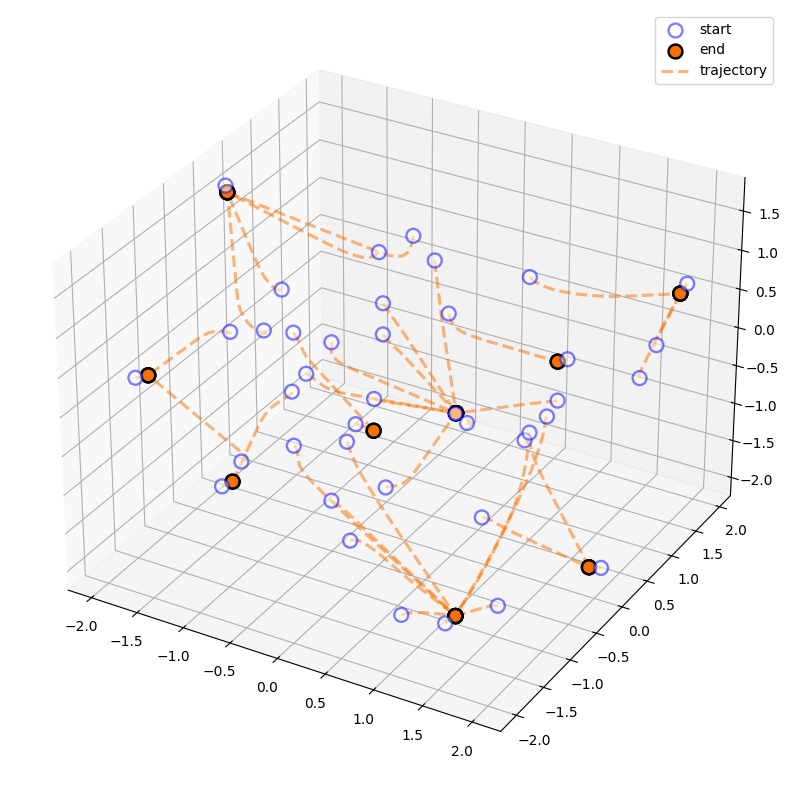

In [18]:
choice = "polytope"
method = "rescale"
d = 3
seq_len = 40

transformer = Transformer(d=d, choice=choice, key=model_key)
x0 = jrandom.uniform(key=x0_key, shape=(seq_len, d), minval=-2, maxval=2)
result = transformer.simulate(x0, T=20, dt=0.1, method=method)
visualize_3d(result, color="#FA7000")

## $Q, K$ is identity matrices, $V$ is initialized at random

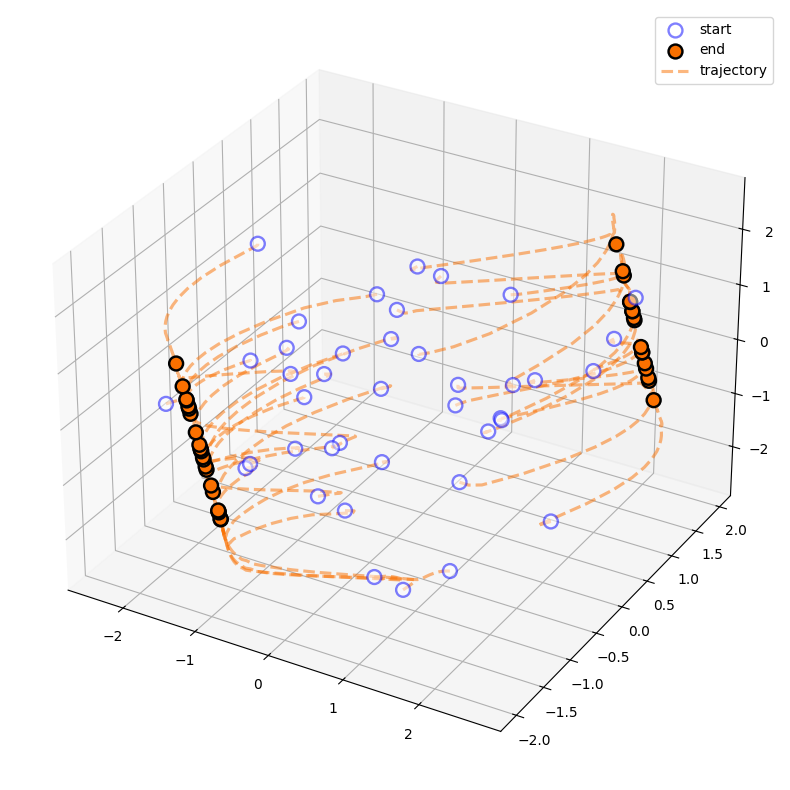

In [23]:
choice = "hyperplanes"
method = "rescale"
d = 3
seq_len = 40

transformer = Transformer(d=d, choice=choice, key=model_key)
x0 = jrandom.uniform(key=x0_key, shape=(seq_len, d), minval=-2, maxval=2)
result = transformer.simulate(x0, T=10, dt=0.1, method=method)
visualize_3d(result, color="#FA7000")